# Gradient-based optimization (steady state)

mitransient's integrators can be used to solve inverse problems just like in Mitsuba 3. Importantly, mitransient extends this idea into the transient domain, where the signal that you obtain from the scene is time-dependent.

This tutorial deals with one of the two forms of inverse rendering: *backward* inverse rendering, in the transient domain. Mathematically, consider $\textbf{x}$ as your set of scene parameters (e.g. material properties, albedos...). Our transient path tracing algorithms are functions $f$ that transform them into a time-resolved image $\textbf{y}$. Given that we are in the transient domain:
$$
\textbf{y}(t) = f(\textbf{x}, t)
$$
The goal of the problem is to match time-resolved image $\textbf{y}$ to an observation $\textbf{y}^\ast$. Thus, you can define a loss function:
$$
L = \text{loss}(\textbf{y}, \textbf{y}^\ast)
$$
<div class="admonition important alert alert-block alert-warning">

This tutorial has two variants: steady-state and transient. The first one assumes that $\textbf{y}$ is steady-state i.e. there is no time dimension. The second one can handle time-dependent estimations $\textbf{y}(t)$. This way, the temporal information could give extra information to the optimization if handled correctly.

</div>

With this formulation, **backward mode differentiation** allows you to compute $\nabla_{\textbf{x}_i}L$ for a subset $\textbf{x}_i \subseteq \textbf{x}$ of the scene parameters. As you will see, the backward mode is very useful to optimize scene parameters:
$$
\textbf{x}_i \leftarrow \textbf{x}_i - \eta \nabla_{\textbf{x}_i}L
$$
With a learning rate $\eta$. If your goal is instead to generate visualizations of the effect of individual scene parameters over time, you should look at forward mode automatic differentiation in mitransient.

<div class="admonition important alert alert-block alert-success">

🚀 **You will learn:**

<ul>
  <li>
  
  What is *backward inverse rendering* and how to use it for gradient-based optimization
  
  </li>
  <li>
  
  How to compute gradients of scene parameters from the render
  
  </li>
  <li>
  
  Set up an optimization with one of Mitsuba's optimizers
  
  </li>
  <li>
  
  Visualize and understand the results of the optimization
  
  </li>
</ul>

</div>

## Importing mitransient

You need to use a Mitsuba variant that enables Automatic Differentiation (AD). Any `*_ad_*` variant will do. Common choices should be `llvm_ad_rgb` for CPU and `cuda_ad_rgb` for GPU.

In [1]:
# If you have compiled Mitsuba 3 yourself, you will need to specify the path
# to the compilation folder
# import sys
# sys.path.insert(0, '<mitsuba-path>/mitsuba3/build/python')
import mitsuba as mi
# To set a variant, you need to have set it in the mitsuba.conf file
# https://mitsuba.readthedocs.io/en/latest/src/key_topics/variants.html
mi.set_variant('llvm_ad_rgb')

import mitransient as mitr
import drjit as dr

print('Using mitsuba version:', mi.__version__)
print('Using Dr.JIT version:', dr.__version__)
print('Using mitransient version:', mitr.__version__)

Using mitsuba version: 3.7.0
Using Dr.JIT version: 1.1.0
Using mitransient version: 1.2.0


## Reference image

We render a reference image of the original scene that will later be used in the objective function for the optimization. Ideally, this reference image should expose very little noise as it will pertube optimization process otherwise. For best results, we should render it with an even larger sample count.

In [2]:
scene = mi.load_file('cornell-box/cbox_volumetric.xml')

In [3]:
image_ref, transient_ref = mi.render(scene, spp=128)

# Preview the reference image
mi.util.convert_to_bitmap(image_ref)

Bitmap[
  pixel_format = rgb,
  component_format = uint8,
  size = [128, 128],
  srgb_gamma = 1,
  struct = Struct<3>[
    uint8 R; // @0, normalized, gamma, premultiplied alpha
    uint8 G; // @1, normalized, gamma, premultiplied alpha
    uint8 B; // @2, normalized, gamma, premultiplied alpha
  ],
  data = [ 48 KiB of image data ]
]

In [4]:
transient_ref_tonemap = mitr.vis.tonemap_transient(transient_ref)
mitr.vis.show_video(transient_ref_tonemap)

Using the `mi.traverse` function will give a list of all parameters that can be differentiated. You should look for parameters with the `∂` symbol. `D` means ns that there are discontinuities involved and, in practice, computation of these gradients can be very noisy/incorrect sometimes.

In [5]:
params = mi.traverse(scene)

params

SceneParameters[
  -------------------------------------------------------------------------------------------------------
  Name                                                Flags    Type              Parent
  -------------------------------------------------------------------------------------------------------
  allow_thread_reordering                                      bool              Scene
  sensor.near_clip                                             float             PerspectiveCamera
  sensor.far_clip                                              float             PerspectiveCamera
  sensor.shutter_open                                          float             PerspectiveCamera
  sensor.shutter_open_time                                     float             PerspectiveCamera
  sensor.film.size                                             ScalarVector2u    Film
  sensor.film.crop_size                                        ScalarVector2u    Film
  sensor.film.crop_offset   

We select the `red.reflectance.value`, which refers to how much light the red wall (on the left of the scene) reflects.

Our inverse problem goes as follows:
1. We have an observation (Cornell Box with a red wall)
2. We perturb the original scene and change the red wall to a blue wall. This is our starting point for the optimization
3. The optimization tries to match the rendered image (our first estimation will be blue) to the original red wall.

In [6]:
key = 'red.reflectance.value'

# Save the original value
param_ref = mi.Color3f(params[key])

# Set another color value and update the scene
params[key] = mi.Color3f(0.01, 0.2, 0.9)
params.update();

As expected, when rendering the scene again, the wall has changed color.

In [7]:
image_init, transient = mi.render(scene, spp=128)
mi.util.convert_to_bitmap(image_init)

Bitmap[
  pixel_format = rgb,
  component_format = uint8,
  size = [128, 128],
  srgb_gamma = 1,
  struct = Struct<3>[
    uint8 R; // @0, normalized, gamma, premultiplied alpha
    uint8 G; // @1, normalized, gamma, premultiplied alpha
    uint8 B; // @2, normalized, gamma, premultiplied alpha
  ],
  data = [ 48 KiB of image data ]
]

We set up an `Optimizer` (in this case Adam), and tell it to optimize the left wall's color

In [8]:
opt = mi.ad.Adam(lr=0.05)
opt[key] = params[key]
params.update(opt);

At every iteration of the gradient descent, we will compute the derivatives of the scene parameters with respect to the objective function. In this simple experiment, we use the [*mean square error*][1], or $L_2$ error, between the current image and the reference created above.

[1]: https://en.wikipedia.org/wiki/Mean_squared_error

In [9]:
def mse(image):
    return dr.mean(dr.square(image - image_ref))

In the following cell we define the hyper parameters controlling our optimization loop, such as the number of iterations:

In [10]:
iteration_count = 50

It is now time to actually perform the gradient-descent loop that executes 50 differentiable rendering iterations.

In [11]:
errors = []
for it in range(50):
    # Perform a (noisy) differentiable rendering of the scene
    image, transient = mi.render(scene, params, spp=32)
    
    # Evaluate the objective function from the current rendered image
    loss = mse(image)

    # Backpropagate through the rendering process
    dr.backward(loss)

    # Optimizer: take a gradient descent step
    opt.step()

    # Post-process the optimized parameters to ensure legal color values.
    opt[key] = dr.clip(opt[key], 0.0, 1.0)

    # Update the scene state to the new optimized values
    params.update(opt)
    
    # Track the difference between the current color and the true value
    err_ref = dr.sum(dr.square(param_ref - params[key]))
    print(f"Iteration {it:02d}: parameter error = {err_ref}", end='\r')
    errors.append(dr.slice(err_ref))
print('\nOptimization complete.')

Iteration 49: parameter error = [0.00121203]
Optimization complete.


## Results

We can now render the scene again to check whether the optimization process successfully recovered the color of the red wall.

In [12]:
image_final_steady, image_final_transient = mi.render(scene, spp=128)
mi.util.convert_to_bitmap(image_final_steady)

Bitmap[
  pixel_format = rgb,
  component_format = uint8,
  size = [128, 128],
  srgb_gamma = 1,
  struct = Struct<3>[
    uint8 R; // @0, normalized, gamma, premultiplied alpha
    uint8 G; // @1, normalized, gamma, premultiplied alpha
    uint8 B; // @2, normalized, gamma, premultiplied alpha
  ],
  data = [ 48 KiB of image data ]
]

It worked!

Note visualizing the objective value directly sometimes gives limited information, since differences between `image` and `image_ref` can be dominated by Monte Carlo noise that is not related to the parameter being optimized. 

Since we know the “true” target parameter in this scene, we can validate the convergence of the optimization by checking the difference to the true color at each iteration:

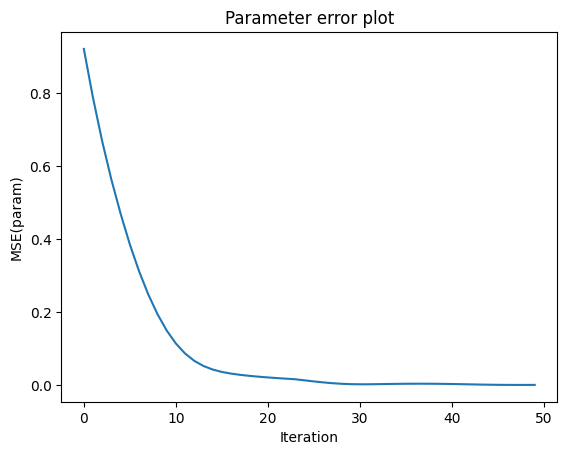

In [14]:
import matplotlib.pyplot as plt
plt.plot(errors)
plt.xlabel('Iteration'); plt.ylabel('MSE(param)'); plt.title('Parameter error plot');
plt.show()